suavizado de poi DESENFOQUE A POI

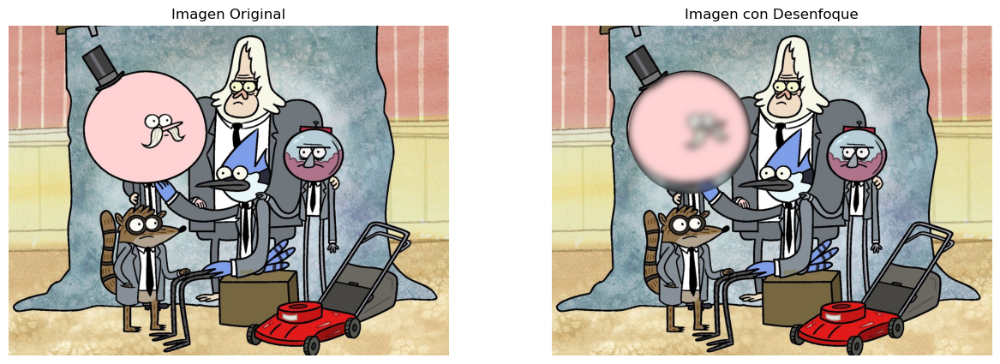

In [21]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def desenfoquePOI(img, centro, x, y):
    copia = np.copy(img)
    valx, valy = centro
    mediox = x // 2
    medioy = y // 2
    mask = np.zeros_like(img, dtype=np.uint8)
    cv2.ellipse(mask, (valx, valy), (mediox, medioy), 0, 0, 360, (255, 255, 255), -1)
    img_mask = cv2.bitwise_and(img, mask)
    blur = cv2.GaussianBlur(img_mask, (75, 75), 0)
    copia[mask != 0] = blur[mask != 0]
    return copia

img = cv2.imread('imagen.jpg')
imgRGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
imgBlur = desenfoquePOI(imgRGB, (450, 350), 400, 400)

plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.title('Imagen Original')
plt.imshow(imgRGB)
plt.axis('off')

plt.subplot(122)
plt.title('Imagen con Desenfoque')
plt.imshow(imgBlur)
plt.axis('off')
plt.show()

Bordes y mascaras

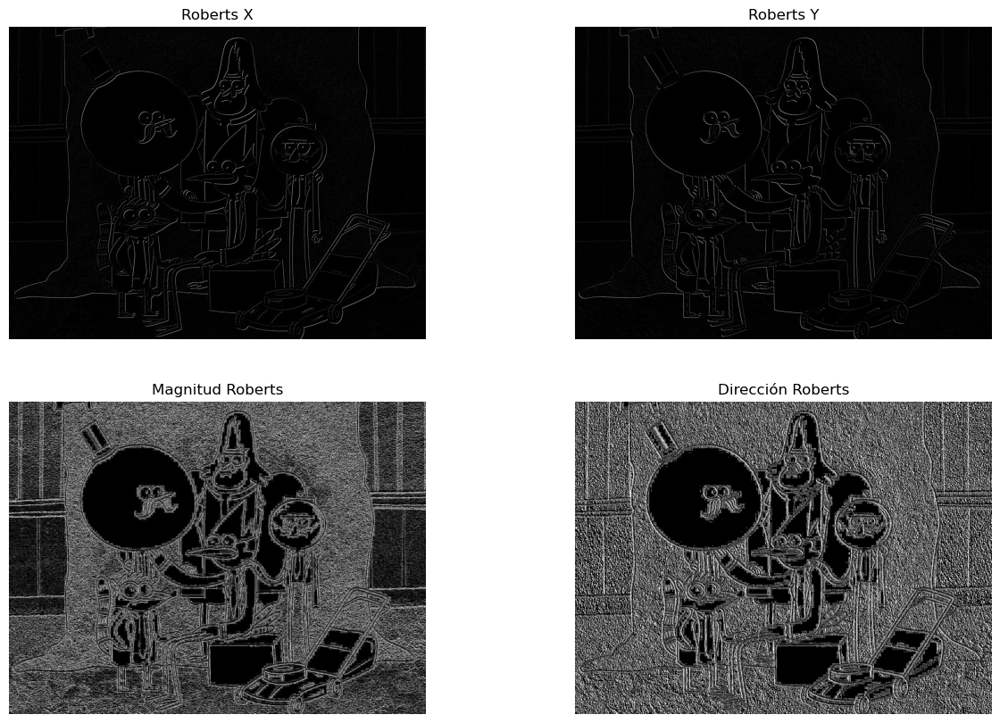

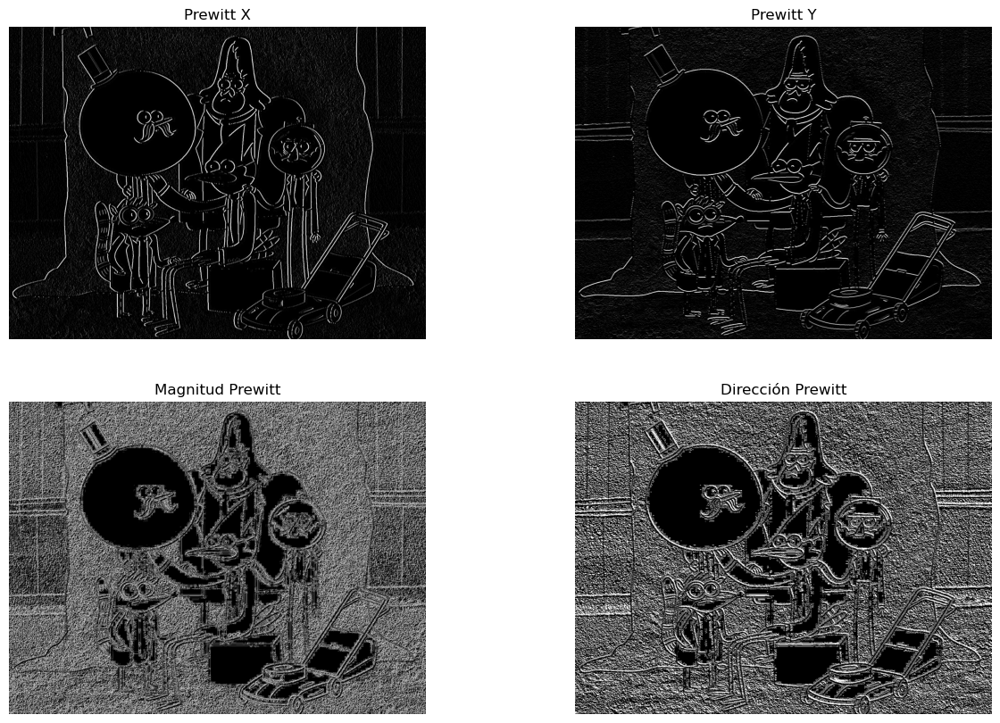

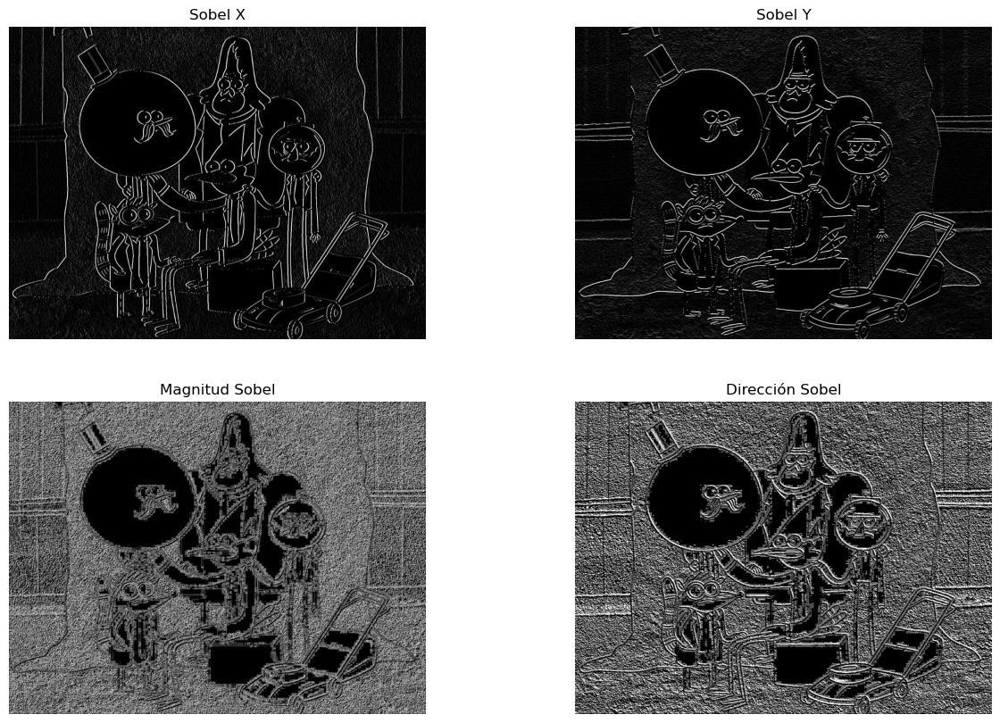

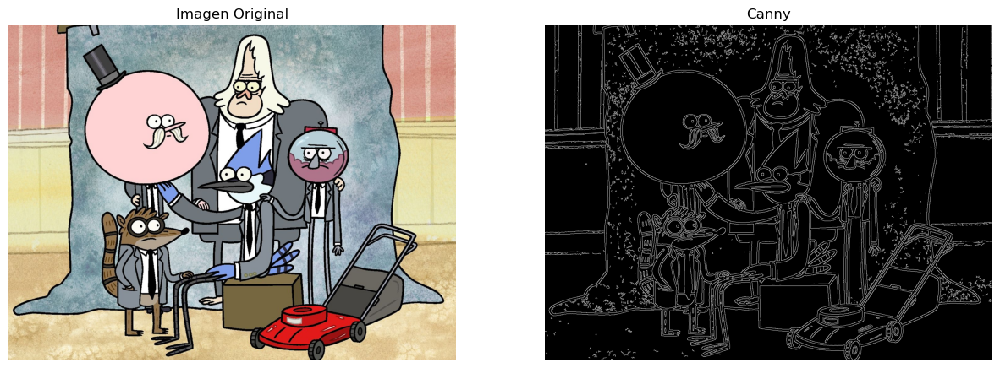

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img = cv2.imread('imagen.jpg')
imgGRAY = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

#Roberts
robertsx = np.array([[-1, 0],
                     [0, 1]])
robertsy = np.array([[0, -1],
                     [1, 0]])

imgROBERX = cv2.filter2D(imgGRAY, -1, robertsx)
imgROBERY = cv2.filter2D(imgGRAY, -1, robertsy)

magROBER = np.sqrt(imgROBERX**2 + imgROBERY**2)
dirROBER = np.arctan2(imgROBERY, imgROBERX)

#Prewitt
prewittx = np.array([[1, 0, -1],
                     [1, 0, -1],
                     [1, 0, -1]])
prewitty = np.array([[1, 1, 1],
                     [0, 0, 0],
                     [-1, -1, -1]])

imgPREWITTX = cv2.filter2D(imgGRAY, -1, prewittx)
imgPREWITTY = cv2.filter2D(imgGRAY, -1, prewitty)

magPREW = np.sqrt(imgPREWITTX**2 + imgPREWITTY**2)
dirPREW = np.arctan2(imgPREWITTY, imgPREWITTX)

#Sobel
sobelx = np.array([[1, 0, -1],
                   [2, 0, -2],
                   [1, 0, -1]])
sobely = np.array([[1, 2, 1],
                   [0, 0, 0],
                   [-1, -2, -1]])

imgSOBELX = cv2.filter2D(imgGRAY, -1, sobelx)
imgSOBELY = cv2.filter2D(imgGRAY, -1, sobely)

magSOBEL = np.sqrt(imgSOBELX**2 + imgSOBELY**2)
dirSOBEL = np.arctan2(imgSOBELY, imgSOBELX)

#Canny
imgCANNY = cv2.Canny(imgGRAY, 100, 200)

#mostrar roberts
plt.figure(figsize=(15, 10))
plt.subplot(221)
plt.title('Roberts X')
plt.imshow(imgROBERX, cmap='gray')
plt.axis('off')

plt.subplot(222)
plt.title('Roberts Y')
plt.imshow(imgROBERY, cmap='gray')
plt.axis('off')

plt.subplot(223)
plt.title('Magnitud Roberts')
plt.imshow(magROBER, cmap='gray')
plt.axis('off')

plt.subplot(224)
plt.title('Dirección Roberts')
plt.imshow(dirROBER, cmap='gray')
plt.axis('off')
plt.show()

#mostrar prewitt
plt.figure(figsize=(15, 10))
plt.subplot(221)
plt.title('Prewitt X')
plt.imshow(imgPREWITTX, cmap='gray')
plt.axis('off')

plt.subplot(222)
plt.title('Prewitt Y')
plt.imshow(imgPREWITTY, cmap='gray')
plt.axis('off')

plt.subplot(223)
plt.title('Magnitud Prewitt')
plt.imshow(magPREW, cmap='gray')
plt.axis('off')

plt.subplot(224)
plt.title('Dirección Prewitt')
plt.imshow(dirPREW, cmap='gray')
plt.axis('off')
plt.show()

#mostrar sobel
plt.figure(figsize=(15, 10))
plt.subplot(221)
plt.title('Sobel X')
plt.imshow(imgSOBELX, cmap='gray')
plt.axis('off')

plt.subplot(222)
plt.title('Sobel Y')
plt.imshow(imgSOBELY, cmap='gray')
plt.axis('off')

plt.subplot(223)
plt.title('Magnitud Sobel')
plt.imshow(magSOBEL, cmap='gray')
plt.axis('off')

plt.subplot(224)
plt.title('Dirección Sobel')
plt.imshow(dirSOBEL, cmap='gray')
plt.axis('off')
plt.show()

#mostrar canny
plt.figure(figsize=(15, 10))
plt.subplot(121)
plt.title('Imagen Original')
plt.imshow(imgRGB)
plt.axis('off')

plt.subplot(122)
plt.title('Canny')
plt.imshow(imgCANNY, cmap='gray')
plt.axis('off')
plt.show()

Roberts

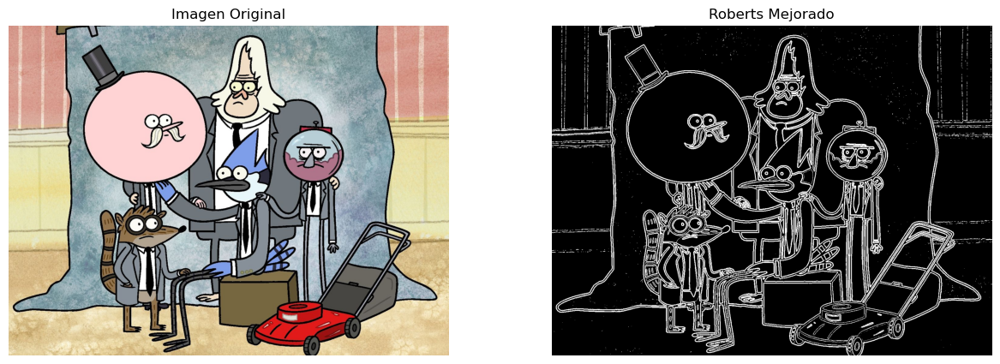

In [41]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def robertsMejorado(img):
    imgGRAY = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    suavizado = cv2.GaussianBlur(imgGRAY, (3, 3), 0)
    kernelx = np.array([[-2, 0],
                        [0, 2]], dtype=np.float32)
    kernely = np.array([[0, -2],
                        [2, 0]], dtype=np.float32)
    robx = cv2.filter2D(suavizado, cv2.CV_16S, kernelx)
    roby = cv2.filter2D(suavizado, cv2.CV_16S, kernely)

    roberts = cv2.addWeighted(np.abs(robx), 0.5, np.abs(roby), 0.5, 0)
    _, robFinal = cv2.threshold(roberts, 30, 255, cv2.THRESH_BINARY)
    return robFinal

imagen = cv2.imread('imagen.jpg')
imagenRGB = cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB)

imagenROBER = robertsMejorado(imagenRGB)
plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.title('Imagen Original')
plt.imshow(imagenRGB)
plt.axis('off')

plt.subplot(122)
plt.title('Roberts Mejorado')
plt.imshow(imagenROBER, cmap='gray')
plt.axis('off')
plt.show()

Prewitt

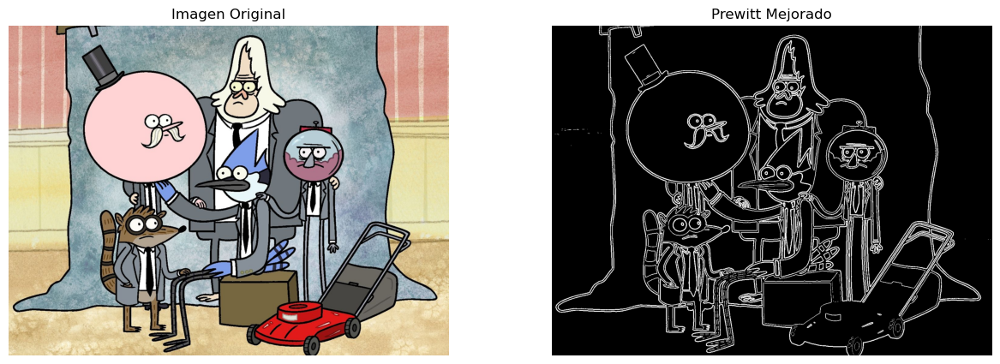

In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def prewittMejorado(img):
    imgGRAY = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    imgGRAY = cv2.GaussianBlur(imgGRAY, (3, 3), 0)

    prewittx = np.array([[3, 0, -3],
                         [3, 0, -3],
                         [3, 0, -3]], dtype=np.float32)
    prewitty = np.array([[3, 3, 3],
                         [0, 0, 0],
                         [-3, -3, -3]], dtype=np.float32)
    
    x = cv2.filter2D(imgGRAY, cv2.CV_64F, prewittx)
    y = cv2.filter2D(imgGRAY, cv2.CV_64F, prewitty)

    magPREW = np.sqrt(x**2 + y**2)
    magPREW = cv2.normalize(magPREW, None, 0, 255, cv2.NORM_MINMAX)
    magPREW = np.uint8(magPREW)

    _, prewittFinal = cv2.threshold(magPREW, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    return prewittFinal

imagen = cv2.imread('imagen.jpg')
imagenRGB = cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB)

imagenROBER = prewittMejorado(imagenRGB)
plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.title('Imagen Original')
plt.imshow(imagenRGB)
plt.axis('off')

plt.subplot(122)
plt.title('Prewitt Mejorado')
plt.imshow(imagenROBER, cmap='gray')
plt.axis('off')
plt.show()

Sobel

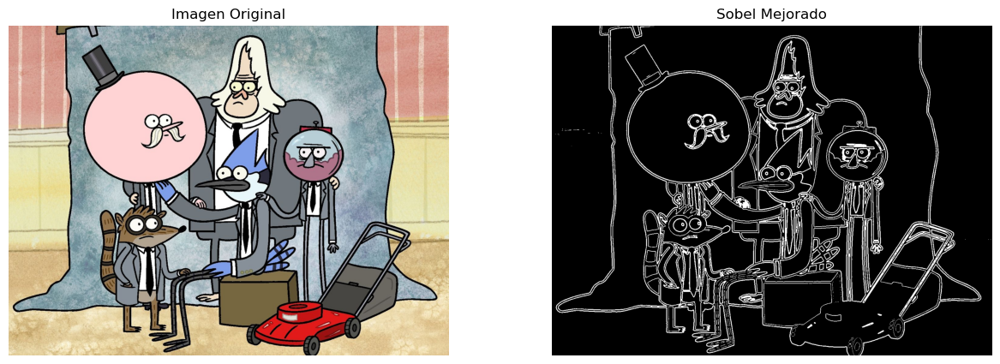

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def sobelMejorado(img, kernel = 3, umbral = 30):
    imgGRAY = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    imgGRAY = cv2.GaussianBlur(imgGRAY, (3, 3), 0)

    sobelx = cv2.Sobel(imgGRAY, cv2.CV_64F, 1, 0, ksize=kernel)
    sobely = cv2.Sobel(imgGRAY, cv2.CV_64F, 0, 1, ksize=kernel)
    
    magSOBEL = cv2.magnitude(sobelx, sobely)
    
    magSOBEL = cv2.normalize(magSOBEL, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U)

    _, bordes = cv2.threshold(magSOBEL, umbral, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    kernelMorf = np.ones((2, 2), np.uint8)
    sobFinal = cv2.morphologyEx(bordes, cv2.MORPH_CLOSE, kernelMorf)
    return sobFinal

imagen = cv2.imread('imagen.jpg')
imagenRGB = cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB)

imagenROBER = sobelMejorado(imagenRGB)
plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.title('Imagen Original')
plt.imshow(imagenRGB)
plt.axis('off')

plt.subplot(122)
plt.title('Sobel Mejorado')
plt.imshow(imagenROBER, cmap='gray')
plt.axis('off')
plt.show()

Comparacion Roberts

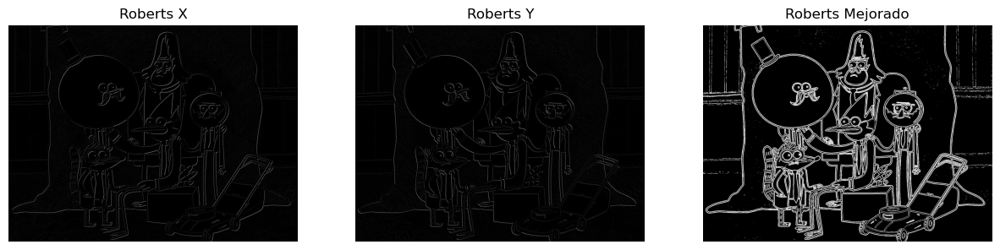

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def robertsFeo(img):
    imgGRAY = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    robertsx = np.array([[-1, 0],
                     [0, 1]])
    robertsy = np.array([[0, -1],
                         [1, 0]])

    imgROBERX = cv2.filter2D(imgGRAY, -1, robertsx)
    imgROBERY = cv2.filter2D(imgGRAY, -1, robertsy)
    return imgROBERX, imgROBERY

def robertsMejorado(img):
    imgGRAY = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    suavizado = cv2.GaussianBlur(imgGRAY, (3, 3), 0)
    kernelx = np.array([[-2, 0],
                        [0, 2]], dtype=np.float32)
    kernely = np.array([[0, -2],
                        [2, 0]], dtype=np.float32)
    robx = cv2.filter2D(suavizado, cv2.CV_16S, kernelx)
    roby = cv2.filter2D(suavizado, cv2.CV_16S, kernely)

    roberts = cv2.addWeighted(np.abs(robx), 0.5, np.abs(roby), 0.5, 0)
    _, robFinal = cv2.threshold(roberts, 30, 255, cv2.THRESH_BINARY)
    return robFinal

imagen = cv2.imread('imagen.jpg')
imagenRGB = cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB)
imagenROBERX, imagenROBERY = robertsFeo(imagenRGB)

imagenROBER_MEJORADO = robertsMejorado(imagenRGB)

plt.figure(figsize=(15, 5))
plt.subplot(131)
plt.title('Roberts X')
plt.imshow(imagenROBERX, cmap='gray')
plt.axis('off')

plt.subplot(132)
plt.title('Roberts Y')
plt.imshow(imagenROBERY, cmap='gray')
plt.axis('off')

plt.subplot(133)
plt.title('Roberts Mejorado')
plt.imshow(imagenROBER_MEJORADO, cmap='gray')
plt.axis('off')
plt.show()

Comparacion Prewitt

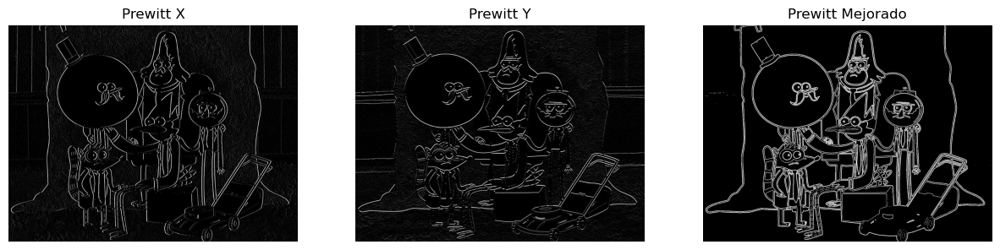

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def prewittFeo(img):
    imgGRAY = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    prewittx = np.array([[1, 0, -1],
                         [1, 0, -1],
                         [1, 0, -1]])
    prewitty = np.array([[1, 1, 1],
                         [0, 0, 0],
                         [-1, -1, -1]])

    imgPREWITTX = cv2.filter2D(imgGRAY, -1, prewittx)
    imgPREWITTY = cv2.filter2D(imgGRAY, -1, prewitty)
    return imgPREWITTX, imgPREWITTY

def prewittMejorado(img):
    imgGRAY = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    imgGRAY = cv2.GaussianBlur(imgGRAY, (3, 3), 0)

    prewittx = np.array([[3, 0, -3],
                         [3, 0, -3],
                         [3, 0, -3]], dtype=np.float32)
    prewitty = np.array([[3, 3, 3],
                         [0, 0, 0],
                         [-3, -3, -3]], dtype=np.float32)
    
    x = cv2.filter2D(imgGRAY, cv2.CV_64F, prewittx)
    y = cv2.filter2D(imgGRAY, cv2.CV_64F, prewitty)

    magPREW = np.sqrt(x**2 + y**2)
    magPREW = cv2.normalize(magPREW, None, 0, 255, cv2.NORM_MINMAX)
    magPREW = np.uint8(magPREW)

    _, prewittFinal = cv2.threshold(magPREW, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    return prewittFinal

imagen = cv2.imread('imagen.jpg')
imagenRGB = cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB)
imagenPREWX, imagenPREWY = prewittFeo(imagenRGB)

imagenPREW_MEJORADO = prewittMejorado(imagenRGB)

plt.figure(figsize=(15, 5))
plt.subplot(131)
plt.title('Prewitt X')
plt.imshow(imagenPREWX, cmap='gray')
plt.axis('off')

plt.subplot(132)
plt.title('Prewitt Y')
plt.imshow(imagenPREWY, cmap='gray')
plt.axis('off')

plt.subplot(133)
plt.title('Prewitt Mejorado')
plt.imshow(imagenPREW_MEJORADO, cmap='gray')
plt.axis('off')
plt.show()

Comparacion Sobel

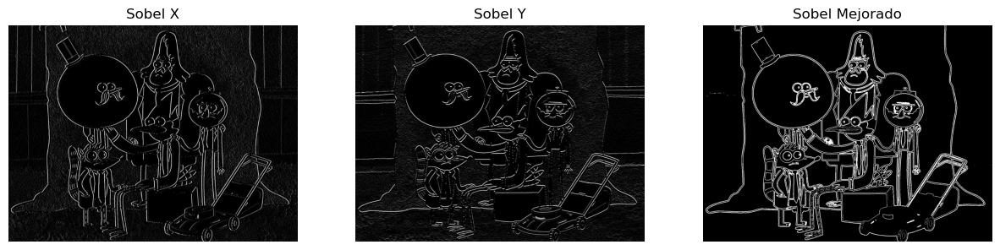

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def prewittFeo(img):
    imgGRAY = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    sobelx = np.array([[1, 0, -1],
                       [2, 0, -2],
                       [1, 0, -1]])
    sobely = np.array([[1, 2, 1],
                       [0, 0, 0],
                       [-1, -2, -1]])

    imgSOBELX = cv2.filter2D(imgGRAY, -1, sobelx)
    imgSOBELY = cv2.filter2D(imgGRAY, -1, sobely)
    return imgSOBELX, imgSOBELY

def sobelMejorado(img, kernel = 3, umbral = 30):
    imgGRAY = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    imgGRAY = cv2.GaussianBlur(imgGRAY, (3, 3), 0)

    sobelx = cv2.Sobel(imgGRAY, cv2.CV_64F, 1, 0, ksize=kernel)
    sobely = cv2.Sobel(imgGRAY, cv2.CV_64F, 0, 1, ksize=kernel)
    
    magSOBEL = cv2.magnitude(sobelx, sobely)
    
    magSOBEL = cv2.normalize(magSOBEL, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U)

    _, bordes = cv2.threshold(magSOBEL, umbral, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    kernelMorf = np.ones((2, 2), np.uint8)
    sobFinal = cv2.morphologyEx(bordes, cv2.MORPH_CLOSE, kernelMorf)
    return sobFinal

imagen = cv2.imread('imagen.jpg')
imagenRGB = cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB)
imagenSOBX, imagenSOBY = prewittFeo(imagenRGB)

imagenSOB_MEJORADO = sobelMejorado(imagenRGB)

plt.figure(figsize=(15, 5))
plt.subplot(131)
plt.title('Sobel X')
plt.imshow(imagenSOBX, cmap='gray')
plt.axis('off')

plt.subplot(132)
plt.title('Sobel Y')
plt.imshow(imagenSOBY, cmap='gray')
plt.axis('off')

plt.subplot(133)
plt.title('Sobel Mejorado')
plt.imshow(imagenSOB_MEJORADO, cmap='gray')
plt.axis('off')
plt.show()

Regiones, Conectividad y Fronteras

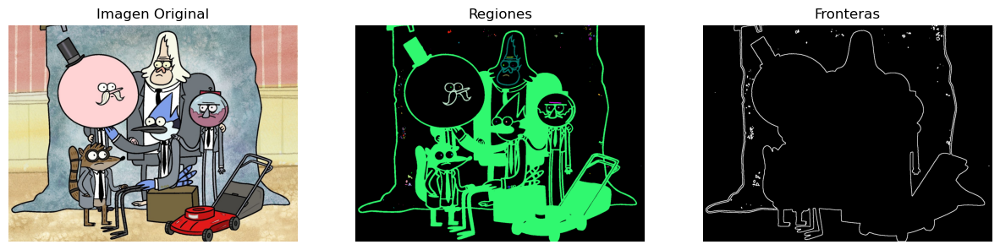

In [12]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

imagen = cv2.imread('imagen.jpg')
gray = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (7, 7), 0)

_, binarized = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

#Regiones
cant, region = cv2.connectedComponents(binarized)
colores = np.random.randint(0, 255, size=(cant, 3), dtype=np.uint8)
colores[0] = [0, 0, 0]
region_coloreada = colores[region]

#Fronteras
contorno, _ = cv2.findContours(binarized, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
lines = cv2.drawContours(np.zeros_like(gray), contorno, -1, 255, 2)

#Mostrar imagenes
plt.figure(figsize=(15, 5))
plt.subplot(131)
plt.title('Imagen Original')
plt.imshow(cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(132)
plt.title('Regiones')
plt.imshow(region_coloreada)
plt.axis('off')

plt.subplot(133)
plt.title('Fronteras')
plt.imshow(lines, cmap='gray')
plt.axis('off')
plt.show()

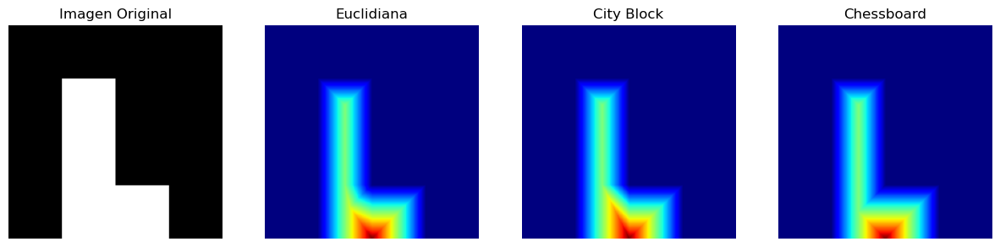

In [24]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img = np.zeros((200,200), dtype=np.uint8)
img[50:150, 50:100] = 1
img[150:200, 50:150] = 1

def distancia(img):
    #euclidiana
    dist_eu = cv2.distanceTransform(img, cv2.DIST_L2, 3)
    #cityblock
    dist_city = cv2.distanceTransform(img, cv2.DIST_L1, 3)
    #chessboard
    dist_chess = cv2.distanceTransform(img, cv2.DIST_C, 3)
    
    return dist_eu, dist_city, dist_chess

eu, city, chess = distancia(img)

def normalizar(distancia):
    return cv2.normalize(distancia, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

eu_normalized = normalizar(eu)
city_normalized = normalizar(city)
chess_normalized = normalizar(chess)

plt.figure(figsize=(15, 5))
plt.subplot(141)
plt.title('Imagen Original')
plt.imshow(img, cmap='gray')
plt.axis('off')

plt.subplot(142)
plt.title('Euclidiana')
plt.imshow(eu_normalized, cmap='jet')
plt.axis('off')

plt.subplot(143)
plt.title('City Block')
plt.imshow(city_normalized, cmap='jet')
plt.axis('off')

plt.subplot(144)
plt.title('Chessboard')
plt.imshow(chess_normalized, cmap='jet')
plt.axis('off')
plt.show()

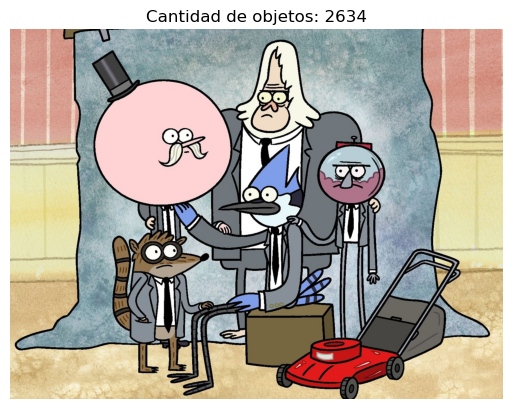

In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import measure

def contar(img):
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    _, img_bin = cv2.threshold(img_gray, 127, 255, cv2.THRESH_BINARY_INV)
    etiquetar = measure.label(img_bin, connectivity=2) #4=2 8=1
    num = np.max(etiquetar)
    return num

imagen = cv2.imread('imagen.jpg')
cuenta = contar(imagen)
plt.imshow(cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB))
plt.title(f'Cantidad de objetos: {cuenta}')
plt.axis('off')
plt.show()

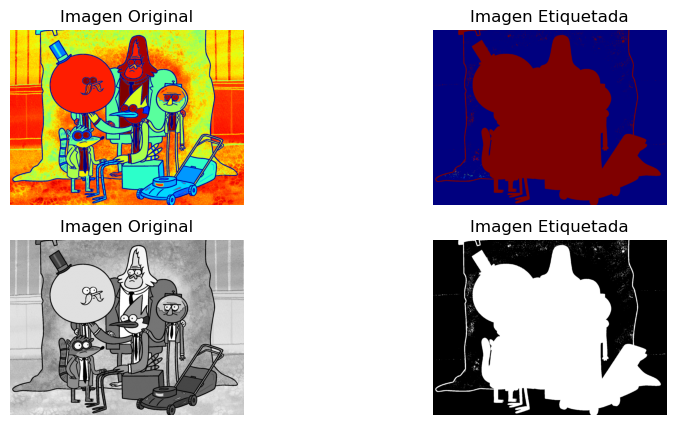

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import measure

def etiquetar(img):
    _, img_bin = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY_INV)
    contorno, _ = cv2.findContours(img_bin, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    img_eti = np.zeros_like(img, dtype=np.uint8)
    for i, c in enumerate(contorno):
        cv2.drawContours(img_eti, [c], -1, (i + 1), -1)
    return img_eti

img = cv2.imread('imagen.jpg', 0)

img_eti = etiquetar(img)

plt.figure(figsize=(10, 5))
plt.subplot(221)
plt.title('Imagen Original')
plt.imshow(img, cmap='jet')
plt.axis('off')

plt.subplot(222)
plt.title('Imagen Etiquetada')
plt.imshow(img_eti, cmap='jet')
plt.axis('off')

plt.subplot(223)
plt.title('Imagen Original')
plt.imshow(img, cmap='gray')
plt.axis('off')

plt.subplot(224)
plt.title('Imagen Etiquetada')
plt.imshow(img_eti, cmap='gray')
plt.axis('off')
plt.show()

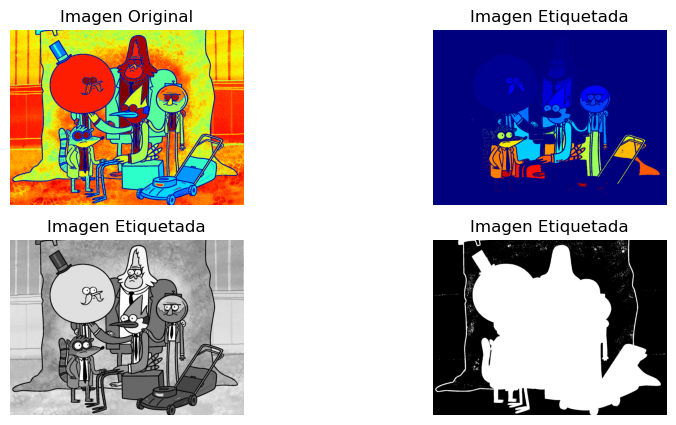

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import measure

img_gray = cv2.imread('imagen.jpg',0)
_,imgbin = cv2.threshold(img_gray,127,255,cv2.THRESH_BINARY)
img_etiq = measure.label(imgbin,connectivity=1)

plt.figure(figsize=(10, 5))

plt.subplot(221)
plt.title('Imagen Original')
plt.imshow(img_gray, cmap='jet')
plt.axis('off')

plt.subplot(222)
plt.title('Imagen Etiquetada')
plt.imshow(img_etiq, cmap='jet')
plt.axis('off')

plt.subplot(223)
plt.title('Imagen Etiquetada')
plt.imshow(img_gray, cmap='gray')
plt.axis('off')

plt.subplot(224)
plt.title('Imagen Etiquetada')
plt.imshow(img_eti, cmap='gray')
plt.axis('off')
plt.show()